## Übung zu Kapitel 6

In dieser Übung wollen wir das Clustering vertiefen. Das Ziel ist es, die Parameterauswahl und die Interpretation der Cluster bei hochdimensionalen Daten zu üben. Die Interpretation ist auch die größte Schwierigkeit dieser Übung.
Als Daten verwenden wir die Bostondaten. Hier noch ein paar Tipps vorweg:

- Denken Sie an die Wertebereiche der Merkmale. Diese könnten einen Einfluss auf die Ergebnisse haben.
- Durch die Dimensionalität ist es schwierig, die Cluster zu interpretieren. Setzen Sie die PCA und paarweise Scatterplots ein (siehe Kapitel 4). Beide haben gewisse Vor- und Nachteile, auf die Sie hier auch achten können.

In jedem der folgenden Aufgabenteile sollten Sie probieren, die Bedeutung jedes Clusters zu bestimmen, also eine Beschreibung der Instanzen, die gemeinsam gruppiert werden, als eine Art Gruppenname.

### $k$-Means-Algorithmus

Benutzen Sie den $k$-Means-Algorithmus, um die Daten zu clustern. Bestimmen Sie eine geeignete Clusteranzahl $k$. Benutzen Sie Ihr Wissen über die Daten, Visualisierungen und WSS, um eine geeignete Anzahl Cluster zu bestimmen.

Zuerst müssen wir die Daten laden. Wir erstellen außerdem zwei Varianten der Daten. Eine mit den unveränderten Merkmalen und eine weitere, in der wir Skaleneffekte durch eine Normierung entfernen. Außerdem nutzen wir noch die Hauptkomponentenanalyse (PCA) um eine zweidimensionale Darstellung der Daten zu bekommen.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import datasets
from sklearn import decomposition
from sklearn.preprocessing import StandardScaler

# first we load the data
boston = datasets.fetch_openml(data_id=531, parser='auto')

# we convert the data into a data frame and use the convenient describe function from pandas
boston_target = boston.target
boston_df = pd.DataFrame(boston.data, columns=boston.feature_names)
boston_df['TARGET'] = boston.target

# we rescale the data by substracting the mean value and dividing by the standard deviation
# this is known as z-score standardization
scaler = StandardScaler()
boston_scaled = scaler.fit_transform(boston_df)

# principle component analysis computes a linear transformation such that the
# few dimensions of the data explain the majority of the variance
# this can be used to visualize data in 2d, even though there are more dimensions
# the problem is: we do not know what the dimensions mean, because they are not our features
pca = decomposition.PCA(n_components=2)
boston_pca = pca.fit_transform(boston_scaled)

# we also surpress warnings, because there are quite a few numeric issues when plotting the data, which are not relevant for this exercise
import warnings
warnings.filterwarnings("ignore")

Wir benutzen die skalierten Daten für das $k$-Means Clustering, um Skaleneffekte zu vermeiden. Wir betrachten die $WSS$ um eine geeignete Anzahl von Clustern zu bestimmen. 

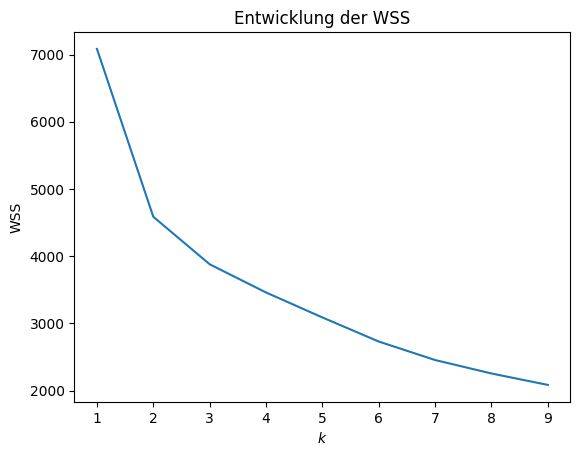

In [2]:
from sklearn.cluster import KMeans

inertia = []
k = range(1,10)
for iter in k:
    kmeans = KMeans(n_clusters=iter, random_state=2)
    kmeans.fit(boston_scaled)
    y_kmeans = kmeans.predict(boston_scaled)
    centers = kmeans.cluster_centers_
    inertia.append(kmeans.inertia_ ) # we already store this for later, inertia=WSS

plt.figure()
plt.title("Entwicklung der WSS")
plt.plot(k, inertia)
plt.ylabel("WSS")
plt.xlabel("$k$")
plt.xticks(k)
plt.show()

Basierend auf dem Plot, scheinen $k=3$ und $k=4$ gute Werte zu sein. Wir benutzen eine PCA um die Clusterergebnisse zu betrachten. 

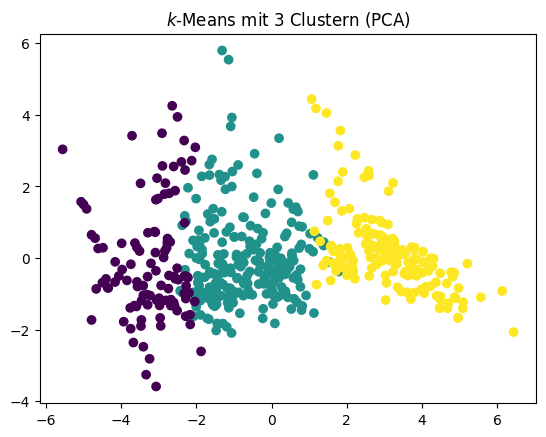

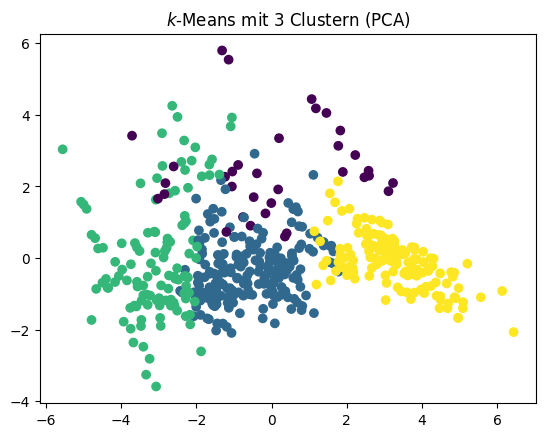

In [3]:
kmeans = KMeans(n_clusters=3, random_state=2)
kmeans.fit(boston_scaled)
y_kmeans = kmeans.predict(boston_scaled)

plt.figure()
plt.scatter(x=boston_pca[:,0], y=boston_pca[:,1], c=y_kmeans)
plt.title("$k$-Means mit 3 Clustern (PCA)")
plt.show()

kmeans = KMeans(n_clusters=4, random_state=2)
kmeans.fit(boston_scaled)
y_kmeans = kmeans.predict(boston_scaled)
centers = kmeans.cluster_centers_

plt.figure()
plt.scatter(x=boston_pca[:,0], y=boston_pca[:,1], c=y_kmeans)
plt.title("$k$-Means mit 3 Clustern (PCA)")
plt.show()

Die Trennung der Daten mit drei Clustern erscheint besser: Man sieht eine relativ klare Trennung von allen drei Clustern. Mit vier Clustern  scheint es ein relativ zufälliges Cluster zu geben (gelb). Um zu verstehen, wofür die Cluster stehen, betrachten wir Scatterplots der Cluster mit allen Merkmalen. 

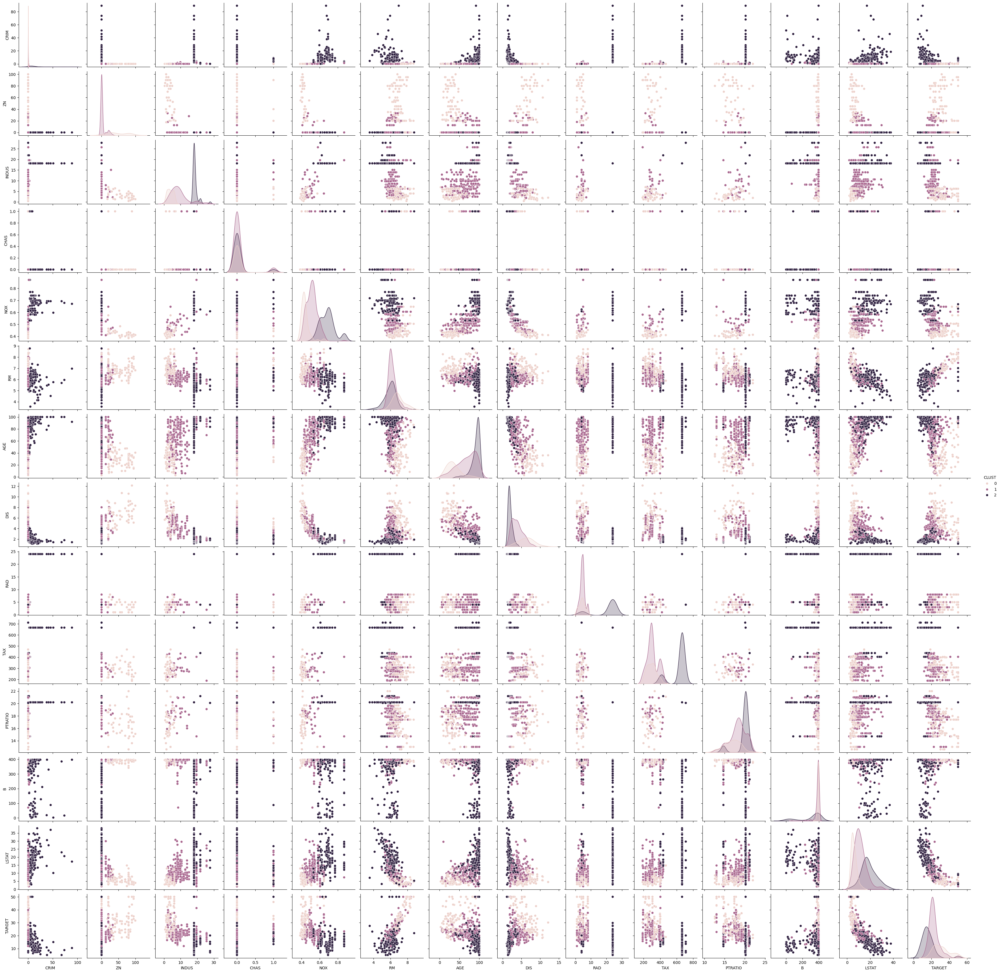

In [4]:
kmeans = KMeans(n_clusters=3, random_state=2)
kmeans.fit(boston_scaled)
y_kmeans = kmeans.predict(boston_scaled)

boston_df_kmeans = boston_df.copy()
boston_df_kmeans['CLUST'] = y_kmeans
sns.pairplot(boston_df_kmeans, hue='CLUST')
plt.show()

Die Scatterplots der vierzehn Merkmale liefern eine riesige Menge an Informationen. Das Hauptproblem dieser Darstellung ist es, zu Wissen wo man mit der Interpretation beginnt. Eine Variante ist es, auf den Diagonalen nach klaren Trennungen zu suchen. Hier kann man bereits viel über die Verteilungen der einzelnen Cluster lernen:

- Das Cluster mit der dunkelsten Schattierung hat die niedrigsten Werte für `INDUS`, `NOX`, `AGE` und `LSTAT` und die höchsten Werte für `ZN` und `DIS`. Es handelt sich also um Gebiete mit wenig Industrie, einer niedrigen Luftverschmutzung, vielen neuen Häusern, einem relativ hohen Bildungsgrad, und einem großen Abstand zu Arbeitsplätzen.
- Das Cluster mit der mittleren Schattierung ist das Gegenteil. Diese Gebiete haben den höchsten Industrieanteil, eine hohe Luftverschmutzung, alte Gebäude, einen relativ niedrigen Bildungsgrad, und sind dicht an den Arbeitsplätzen. 
- Das Cluster mit der hellsten Schattierung ist in allen Merkmalen irgendwo zwischen den beiden anderen Clustern.

Nur durch die Diagonale kann man also bereits die Bedeutung ganz gut erkennen. Die dunkle Schattierung sind eher Vororte, die mittlere Schattierung sind Innenstädte (in Boston Hochhäuser mit Büros) und Industriegebiete, und die helle Schattierung sind Randbereiche der Stadt. 

Durch die Scatterplots kann man dies noch weiter bestätigen. Man sieht zum Beispiel die zu erwartende klare Trennung der Cluster beim Paar `INDUS` und `NOX`. Eine weitere Art der Analyse beim $k$-Means Clustering ist es, sich die Lage der Centroids anzugucken. 

In [5]:
pd.DataFrame(kmeans.cluster_centers_, columns=boston_df.columns)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,TARGET
0,-0.407933,1.505430,-1.065568,-0.051608,-0.995238,0.915684,-1.175232,1.187690,-0.600358,-0.666386,-0.736937,0.355043,-0.948109,0.973424
1,-0.376356,-0.345083,-0.295813,0.012495,-0.333011,-0.092494,-0.021912,0.055975,-0.580237,-0.601504,-0.087653,0.285930,-0.177448,0.034731
2,0.805442,-0.487722,1.119096,0.015767,1.126513,-0.464891,0.798165,-0.855104,1.223134,1.296687,0.606407,-0.641361,0.872853,-0.684867


Das Problem ist, dass diese für die skalierten Daten berechnet wurden. Hierdurch sind die Werte nicht gut interpretierbar. Wir müssen also die Skalierung rückgängig machen. 

In [6]:
pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=boston_df.columns)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,TARGET
0,0.108136,4.643925e+01,3.833832,0.056075,0.439483,6.927374,35.526168,6.293502,4.327103,296.037383,16.861682,389.055607,5.889252,31.476636
1,0.379483,3.323404e+00,9.109404,0.072340,0.516145,6.219711,67.958723,3.912794,4.502128,306.961702,18.265957,382.752170,11.387149,22.851915
2,10.534719,1.421085e-14,18.806585,0.073171,0.685104,5.958317,91.020122,1.996222,20.189024,626.560976,19.767073,298.178963,18.880000,16.240244


Jetzt kann man eine klare Trennung der Centroids erkennen, die auch der Erwartung aus den Visualisierungen entspricht. Man erkennt auch weitere Aspekte, die in den Visualisierungen untergehen. Zum Beispiel gibt es auch bei `RAD` eine klare Trennung zwischen den Clustern. Wenn man diesen Unterschied jedoch nicht visuell bestätigen kann, sollte man dies auch nicht überbewerten. Es könnte sich bei der Trennung von `RAD` auch um ein zufälliges Artefakt handeln. 

### EM Clustering

Benutzen Sie das EM-Clustering, um die Daten zu clustern. Bestimmen Sie eine geeignete Clusteranzahl $k$. Benutzen Sie Ihr Wissen über die Daten, Visualisierungen und BIC, um eine geeignete Anzahl Cluster zu bestimmen.

Auch wenn es durch die Betrachtung der Kovarianzen nicht zwingend notwendig ist, benutzen wir dennoch die skalierten Daten. Hierdurch sind die Ergebnisse besser mit den anderen Algorithmen vergleichbar. Zuerst nutzen wir das BIC um eine geeignete Anzahl Cluster zu bestimmen. 

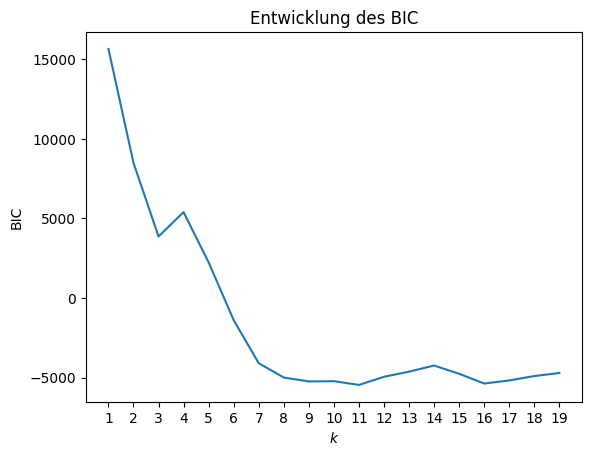

In [7]:
from sklearn.mixture import GaussianMixture

ks=range(1,20)
bic = []
for k in ks:
    em = GaussianMixture(n_components=k,random_state=42)
    em.fit(boston_scaled)
    bic.append(em.bic(boston_scaled))

plt.figure()
plt.title("Entwicklung des BIC")
plt.plot(ks, bic)
plt.ylabel("BIC")
plt.xlabel("$k$")
plt.xticks(ks)
plt.show()

Basierend auf dem BIC scheint $k=7$ die beste Wahl zu sein. Der BIC von $k=10$ ist zwar etwas niedriger, die Linie deutet aber darauf hin, dass es zwischen sieben und 15 keinen großen Unterschied gibt. Wir nehmen aufgrund der Interpretierbarkeit der Ergebnisse den kleinsten Wert, also die sieben. Zuerst betrachten wir wieder die PCA der Cluster. 

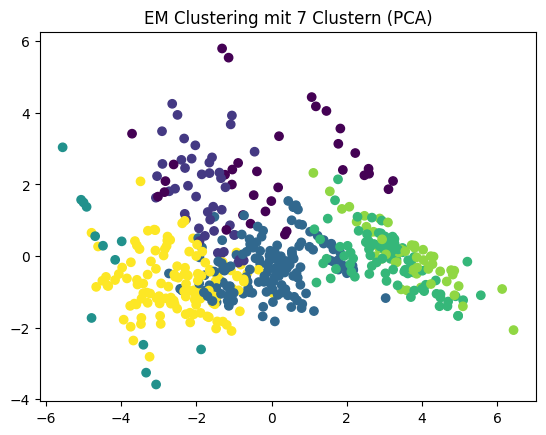

In [8]:
em = GaussianMixture(n_components=7,random_state=1)
em.fit(boston_scaled)
y_em = em.predict(boston_scaled)

plt.figure()
plt.scatter(x=boston_pca[:,0], y=boston_pca[:,1], c=y_em)
plt.title("EM Clustering mit 7 Clustern (PCA)")
plt.show()

Die Cluster scheinen großteils gut getrennt. Einige Cluster überschneiden sich jedoch in den Grenzbereichen, zum Beispiel Türkis und Grün. Nun betrachten wir wieder die Scatterplots. 

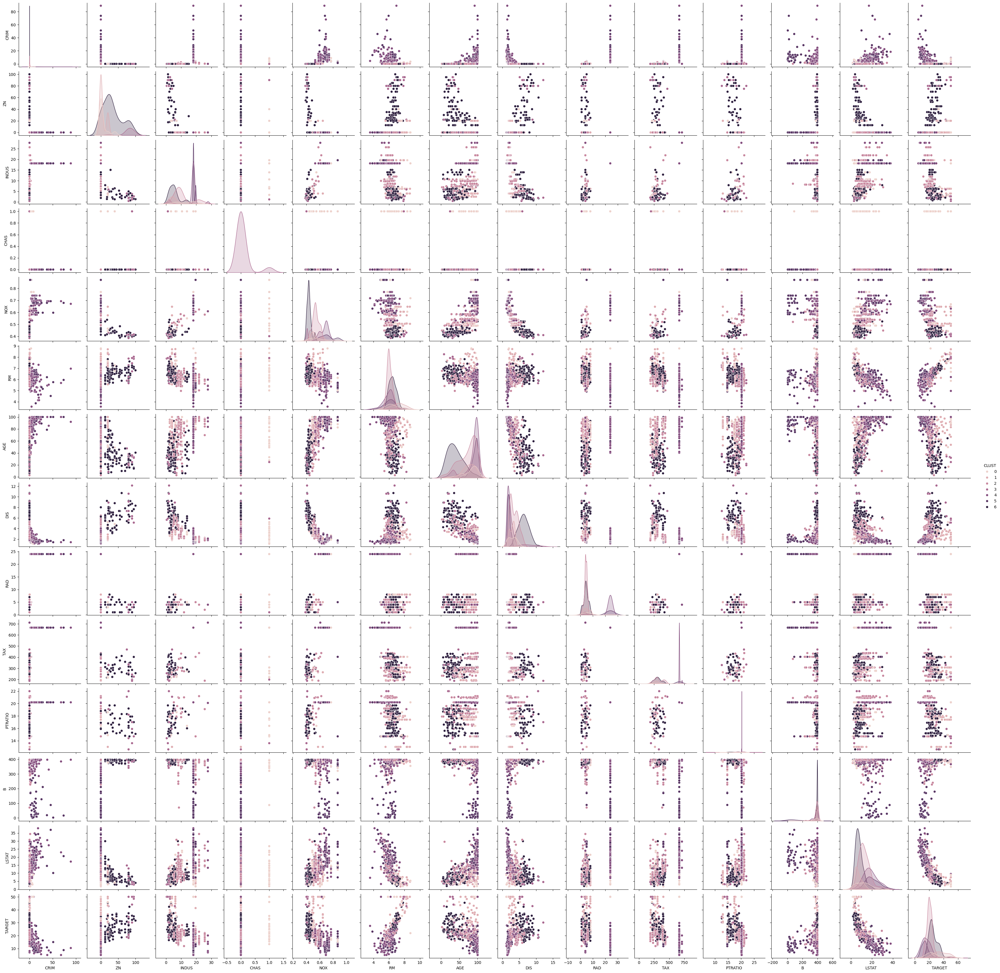

In [9]:
boston_df_em = boston_df.copy()
boston_df_em['CLUST'] = y_em
sns.pairplot(boston_df_em, hue='CLUST')
plt.show()

Diese Grafik ist noch schwerer zu interpretieren als beim $k$-Means Clustering, da es mehr Cluster gibt. Die Densityplots zeigen, dass es häufig Cluster mit ähnlichen Verteilungen in einzelnen Merkmalen gibt. Beim Merkmal `AGE` gibt es zum Beispiel fünf Cluster, bei denen die höchste Dichte etwa gleich zu sein scheint, lediglich die Varianz unterscheidet sich. Es gibt nur zwei Merkmale, wo die Cluster relativ klar getrennt zu sein scheinen: `NOX` und `INDUS`. Da wir bereits unsere Analyse mit $k=3$ vom $k$-Means Clustering kennen, können wir so zu einem sinnvollen Ergebnis gelangen. 

Mit sieben Clustern unterscheiden wir weiterhin zwischen dem Zentrum/Industriegebieten, Vororten, und den Randgebieten der Stadt. Diese Trennung ist jetzt jedoch feingranularer, so dass es zum Beispiel Vororte mit etwas Industrie gibt, und solche komplett ohne. Ob eine solch feingranulare Unterscheidung sinnvoll ist, hängt vom Anwendungsfall ab. 

Ähnlich wie bei $k$-Means können wir uns auch die Lage der Cluster angucken, in diesem Fall durch die Mittelwerte der Normalverteilungen, welche die Cluster beschreiben. 

In [10]:
pd.DataFrame(scaler.inverse_transform(em.means_), columns=boston_df.columns)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,TARGET
0,1.905690,5.294118e+00,13.057647,1.000000e+00,0.599085,6.478324,79.050000,2.945729,9.558824,391.794118,17.605882,372.335000,11.479412,27.805882
1,0.435779,5.455905e+00,5.270086,0.000000e+00,0.537337,7.233801,74.867067,2.877653,4.978006,274.909383,16.179111,387.479004,6.769632,36.253554
2,0.456163,-1.776357e-15,10.993725,-2.775558e-17,0.538992,6.061871,71.829980,3.433602,4.240299,321.460892,19.259581,378.744697,12.889938,20.304693
3,0.057895,7.976918e+01,2.406235,7.693045e-02,0.409170,7.094136,30.460803,7.795204,3.384744,284.457515,16.761929,383.432246,6.196123,35.238491
4,11.435677,1.243450e-14,18.634367,1.387779e-17,0.666011,5.919798,89.814224,2.087432,22.891355,668.494450,20.194457,376.165988,18.581171,16.286729
5,12.505886,-1.776357e-15,18.449608,-2.775558e-17,0.717594,5.961599,91.904676,1.906936,19.511786,603.873671,18.900780,130.326611,20.683046,13.992848
6,0.081649,3.345181e+01,5.521182,2.775558e-17,0.438730,6.463139,39.646128,6.287154,4.443913,308.971865,17.321338,390.099274,8.020707,25.445466


Die Mittelwerte von `INDUS` und `NOX` zeigen auch hier die Unterschiede zwischen den Clustern. Man könnte auch noch die Kovarianzmatrizen betrachten, dies ist jedoch bei sieben 14x14 Matrizen nicht sinnvoll. 

### DBSCAN

Benutzen Sie DBSCAN, um die Daten zu clustern. Bestimmen Sie geeignete Werte für $\epsilon$ und $minPts$. Benutzen Sie Ihr Wissen über die Daten und Visualisierungen, um geeignete Werte zu finden.

Für den DBSCAN Algorithmus nutzen wir ebenfalls die skalierten Daten um Skaleneffekte zu vermeiden. Zuerst betrachten wir die Anzahl der Kernpunkte für verschiedene Kombinationen von $\epsilon$ und $minPts$. 

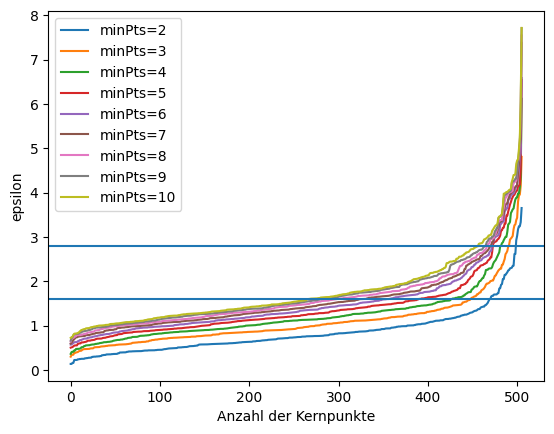

In [11]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

# we use sklearn to find the nearest neighbors
neigh = NearestNeighbors(n_neighbors=10)
nbrs = neigh.fit(boston_scaled)
distances, indices = nbrs.kneighbors(boston_scaled)
for k in range(1, 10):
    distances_k = np.sort(distances[:,k], axis=0)
    plt.plot(distances_k, label='minPts=%i' % (k+1))
    
plt.ylabel('epsilon')
plt.xlabel('Anzahl der Kernpunkte')
plt.axhline(1.6)
plt.axhline(2.8)
plt.legend()
plt.show()

Die horizontalen Linien markieren $\epsilon=1.6$ und $\epsilon=2.8$, welche für $minPts=2$, bzw. $minPts=10$ sinnvoll zu sein scheinen. Dies erkennt man am "Knick" in den Kurven. Wir betrachten die jeweiligen DBSCAN Ergebnisse mit Hilfe der PCA. 

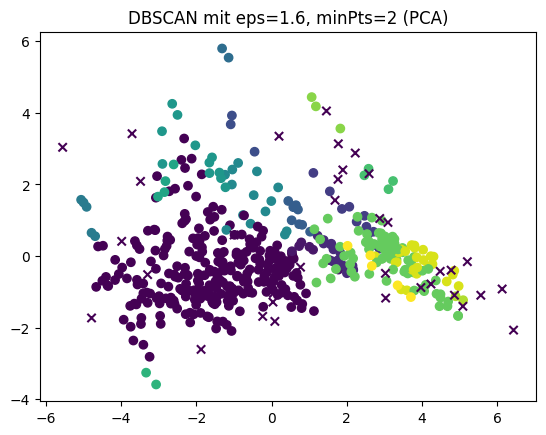

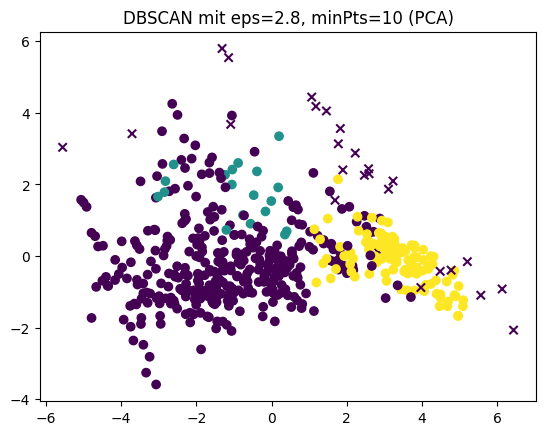

In [12]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=1.6, min_samples=2)
dbscan.fit(boston_scaled)
y_dbscan = dbscan.labels_
noise_mask = y_dbscan<0
plt.figure()
plt.scatter(x=boston_pca[~noise_mask,0], y=boston_pca[~noise_mask,1], c=y_dbscan[~noise_mask])
plt.scatter(x=boston_pca[noise_mask,0], y=boston_pca[noise_mask,1], c=y_dbscan[noise_mask], marker='x')
plt.title("DBSCAN mit eps=1.6, minPts=2 (PCA)")
plt.show()

dbscan = DBSCAN(eps=2.8, min_samples=10)
dbscan.fit(boston_scaled)
y_dbscan = dbscan.labels_
noise_mask = y_dbscan<0
plt.figure()
plt.scatter(x=boston_pca[~noise_mask,0], y=boston_pca[~noise_mask,1], c=y_dbscan[~noise_mask])
plt.scatter(x=boston_pca[noise_mask,0], y=boston_pca[noise_mask,1], c=y_dbscan[noise_mask], marker='x')
plt.title("DBSCAN mit eps=2.8, minPts=10 (PCA)")
plt.show()

Die Ergebnisse sehen ähnlich aus. Der Hauptunterschied ist, dass es einige kleine Cluster mit $minPts=2$ gibt und dass der gelbe Cluster bei $minPts=10$ in zwei  kleinere Cluster bei $minPts=2$ unterteilt ist. Diese kleineren Cluster sind vermutlich keine echten Cluster, sondern ein zufälliger Effekt durch einen kleinen Wert von $minPts$ und ein niedriges $\epsilon$. Wir betrachten daher das Ergebnis für $\epsilon=2.8$ und $minPts=10$ im Scatterplot genauer. 

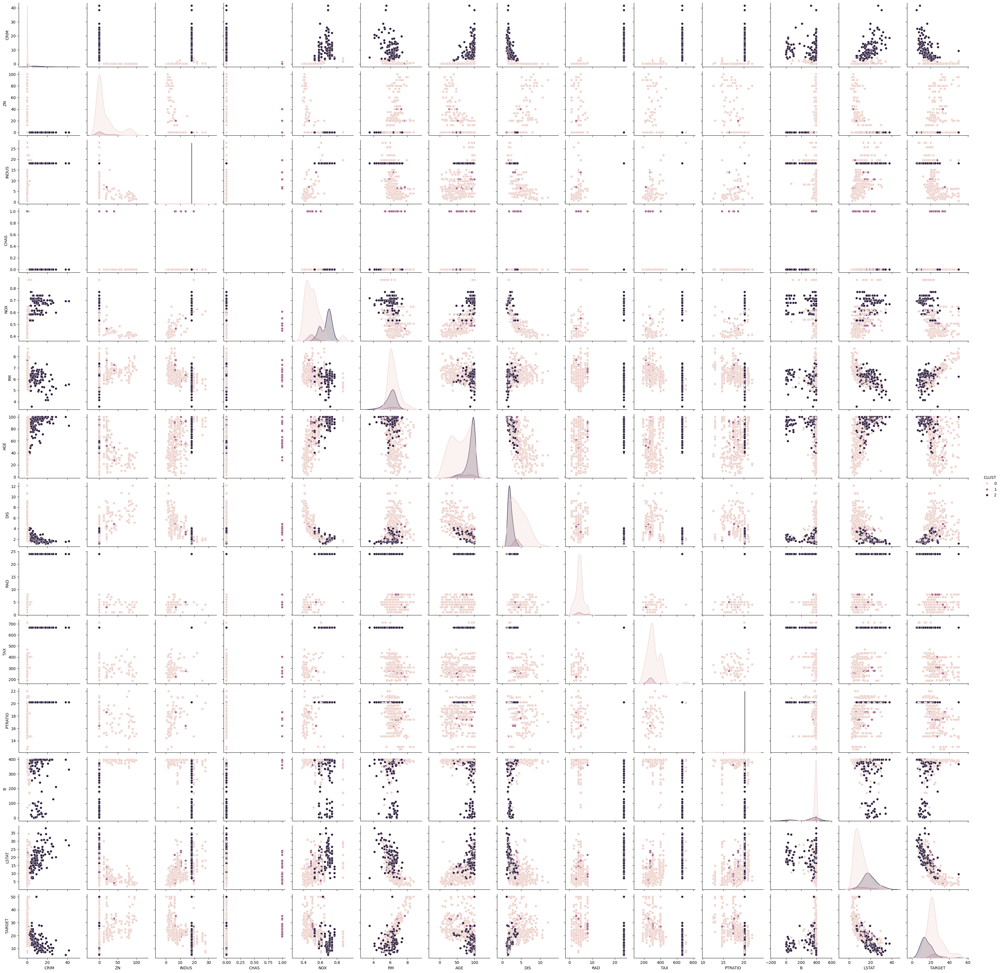

In [13]:
dbscan = DBSCAN(eps=2.8, min_samples=10)
dbscan.fit(boston_scaled)
y_dbscan = dbscan.labels_
noise_mask = y_dbscan<0

boston_df_dbscan = boston_df.copy()
boston_df_dbscan['CLUST'] = y_dbscan
sns.pairplot(boston_df_dbscan[~noise_mask], hue='CLUST')
plt.show()

Wir erkennen drei Cluster in unseren Ergebnissen. Zwei dieser Cluster sind sich sehr ähnlich. Diese zwei Cluster entsprechen dem Stadtzentrum/Industrie, sowie dem Stadtrand. Das andere Cluster beschreibt wieder die Vororte. Das Ergebnis ist also vergleichbar zu $k$-Means, auch wenn die Trennung im Stadtbereich etwas anders ist. Dies folgt aus der Arbeitsweise von DBSCAN. Der Unterschied innerhalb der Stadt ist fließend, so dass es keine "Lücken" in den Daten gibt. Daher werden diese Gebiete auch demselben Cluster zugeordnet. Ledigliche einige Stadtbereiche, die sich stark unterscheiden, landen in einem extra Cluster. Basierend auf dem Scatterplot scheint es sich um Bereiche mit besonders vielen Wohngebäuden zu handeln. 

### SLINK

Benutzen Sie den SLINK-Algorithmus, um die Daten zu clustern. Bestimmen Sie mithilfe eines Dendrogramms einen geeigneten Grenzwert für die Level.

Für den SLINK-Algorithmus nutzen wir ebenfalls die skalierten Daten, um Skaleneffekte zu vermeiden. Zuerst betrachten wir ein Dendrogramm und nutzen das $\epsilon=2.8$ von DBSCAN zum Trennen der Cluster. 

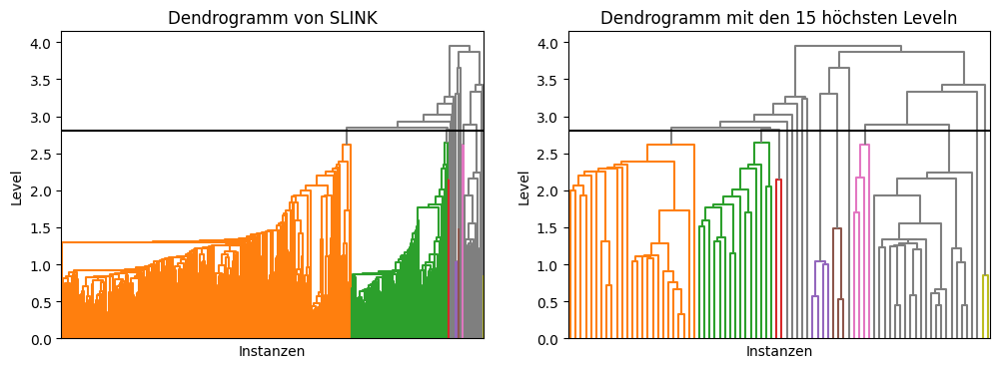

In [14]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

sl = AgglomerativeClustering(n_clusters=None, distance_threshold=2.8, linkage='single', compute_full_tree=True)
sl.fit(boston_scaled)

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

f, axes = plt.subplots(1, 2, sharey=False, sharex=False, figsize=(12, 4))
axes[0].set_title("Dendrogramm von SLINK")
axes[0].set_ylabel("Level")
axes[0].set_xlabel("Instanzen")
plot_dendrogram(sl, no_labels=True, above_threshold_color='grey', ax=axes[0])
axes[0].axhline(y=2.8, c='k')

axes[1].set_title("Dendrogramm mit den 15 höchsten Leveln")
axes[1].set_ylabel("Level")
axes[1].set_xlabel("Instanzen")
plot_dendrogram(sl, no_labels=True, above_threshold_color='grey', p=15, truncate_mode='level', ax=axes[1])
axes[1].axhline(y=2.8, c='k')
plt.show()

Basierend auf dem Dendrogrammen scheint der Grenzwert sinnvoll zu sein. Man könnte sogar einen etwas niedrigeren Wert nehmen (ca. 2.6) ohne das sich etwas ändern würde. Links erkennt man gut, dass die meisten Daten im orangen Cluster liegen, gefolgt vom grünen. Dieser Unterschied wird unterdrückt, wenn man nur die oberen Level betrachtet. Wir betrachten jetzt die Ergebnisse mit der PCA. 

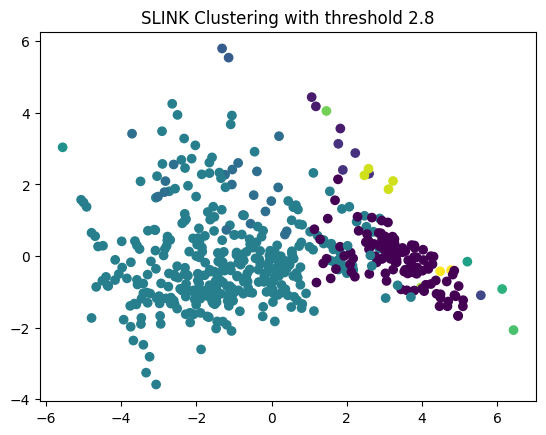

In [15]:
sl = AgglomerativeClustering(n_clusters=None, distance_threshold=2.8, linkage='single', compute_full_tree=True)
sl.fit(boston_scaled)
y_sl = sl.labels_

plt.figure()
plt.scatter(x=boston_pca[:,0], y=boston_pca[:,1], c=y_sl)
plt.title("SLINK Clustering with threshold 2.8")
plt.show()

Die Trennung sieht sinnvoll aus, auch wenn es einige sehr kleine Cluster gibt. Außerdem gibt es im Gegensatz zum DBSCAN Ergebnis nur zwei größere Cluster. Was dieser Unterschied bedeutet erkennt man im Scatterplot. 

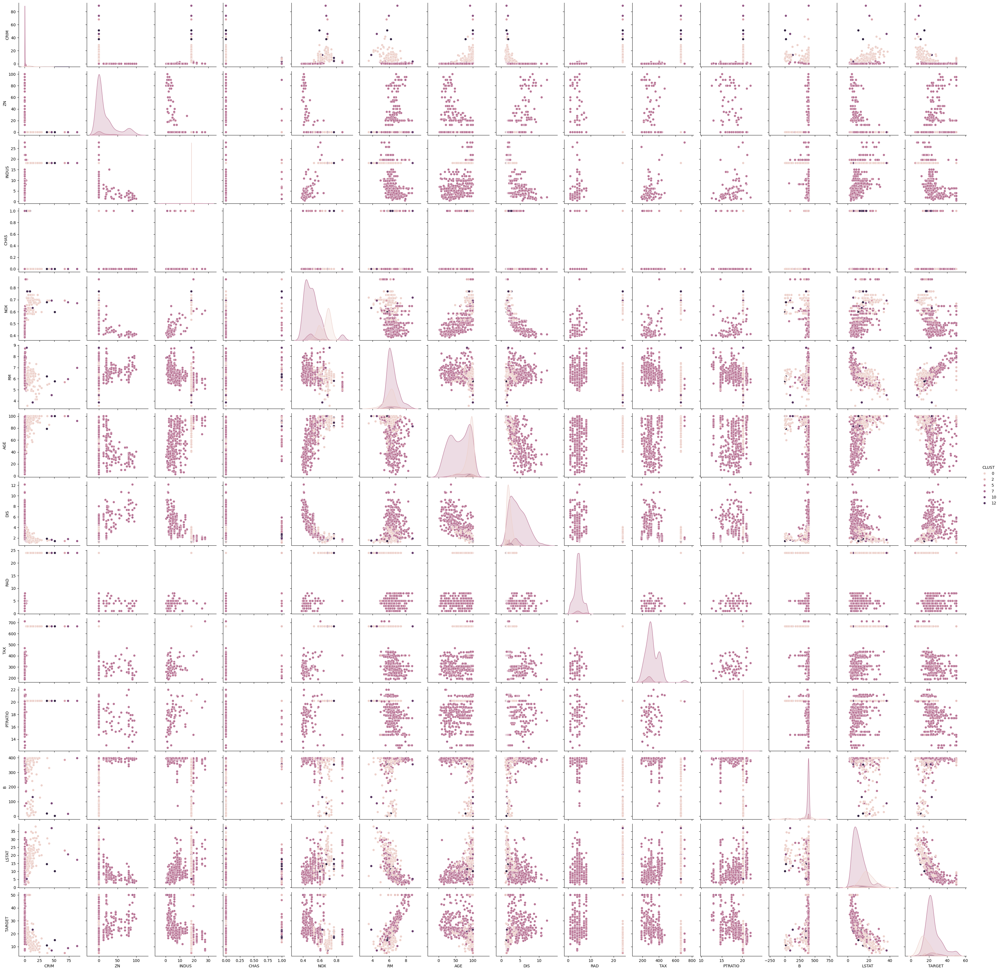

In [16]:
boston_df_sl = boston_df.copy()
boston_df_sl['CLUST'] = y_sl
sns.pairplot(boston_df_sl, hue='CLUST')
plt.show()

Die Ergebnisse sehen wie zu erwarten ähnlich zu DBSCAN aus, da beide Algorithmen auf den paarweisen Distanzen zwischen Instanzen basieren. Dadurch dass es nur noch zwei Cluster gibt, wurden die Stadtbereiche jetzt als ein einziges Cluster modelliert, das zweite größere Cluster sind die Vororte. Die beiden Cluster wurden zusammengeschlossen, das SLINK im wesentlichen DBSCAN mit $minPts=1$ entspricht, wodurch bereits ein ähnliches Gebiet reicht, damit Instanzen im gleichen Cluster landen. Beim DBSCAN wurde dies durch den Parameter $minPts=10$ verhindert. Der zweite wichtige Unterschied sind die kleinen Cluster, die SLINK findet. Diese wurden von DBSCAN als Rauschen erkannt. 

### Vergleichen Sie die Ergebnisse

Vergleichen Sie die Ergebnisse der Algorithmen. Welche Unterschiede gibt es zum Beispiel in der Clusteranzahl und der Form der Cluster? Identifizieren Sie eventuelle Probleme der Algorithmen. 

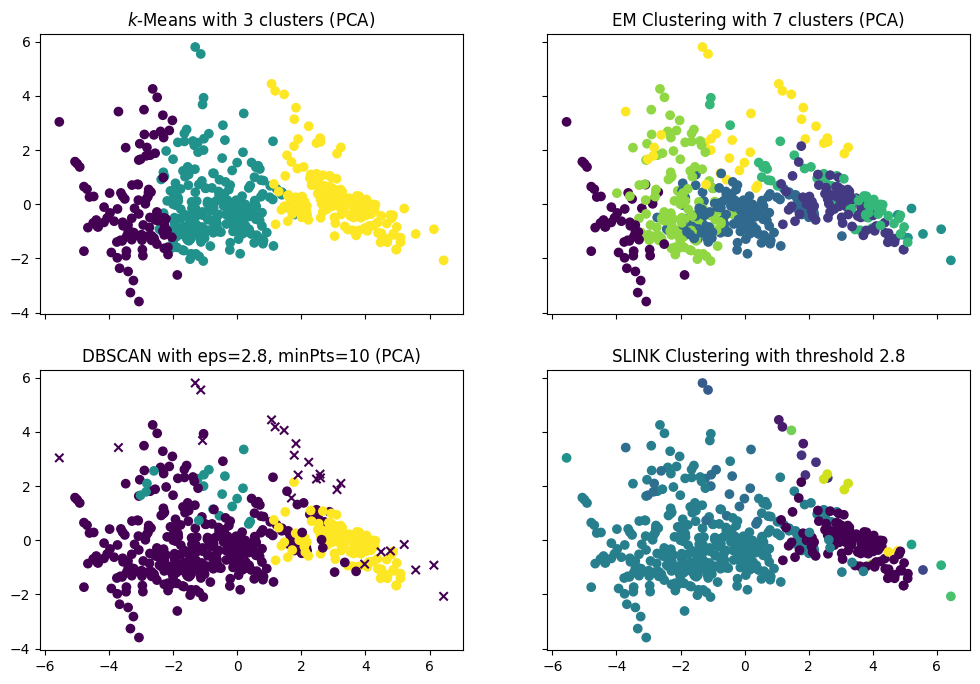

In [17]:
kmeans = KMeans(n_clusters=3, random_state=2)
kmeans.fit(boston_scaled)
y_kmeans = kmeans.predict(boston_scaled)

em = GaussianMixture(n_components=7,random_state=42)
em.fit(boston_scaled)
y_em = em.predict(boston_scaled)

dbscan = DBSCAN(eps=2.8, min_samples=10)
dbscan.fit(boston_scaled)
y_dbscan = dbscan.labels_
noise_mask = y_dbscan<0

sl = AgglomerativeClustering(n_clusters=None, distance_threshold=2.8, linkage='single', compute_full_tree=True)
sl.fit(boston_scaled)
y_sl = sl.labels_

f, axes = plt.subplots(2, 2, sharey=True, sharex=True, figsize=(12, 8))
axes[0,0].scatter(x=boston_pca[:,0], y=boston_pca[:,1], c=y_kmeans)
axes[0,0].set_title("$k$-Means with 3 clusters (PCA)")
axes[0,1].scatter(x=boston_pca[:,0], y=boston_pca[:,1], c=y_em)
axes[0,1].set_title("EM Clustering with 7 clusters (PCA)")
axes[1,0].scatter(x=boston_pca[~noise_mask,0], y=boston_pca[~noise_mask,1], c=y_dbscan[~noise_mask])
axes[1,0].scatter(x=boston_pca[noise_mask,0], y=boston_pca[noise_mask,1], c=y_dbscan[noise_mask], marker='x')
axes[1,0].set_title("DBSCAN with eps=2.8, minPts=10 (PCA)")
axes[1,1].scatter(x=boston_pca[:,0], y=boston_pca[:,1], c=y_sl)
axes[1,1].set_title("SLINK Clustering with threshold 2.8")
plt.show()

Wie man sieht bekommen wir vier verschiedene Ergebnisse. In allen Ergebnissen wird zwischen dem Stadtbereich und den Vororten unterschieden. Wie innerhalb des Stadtbereichs getrennt wird, hängt vom Algorithmus ab. Die Gründe für die Unterschiede haben wir oben bereits betrachtet. Welches Ergebnis das Beste ist, lässt sich basierend auf unseren Daten nicht sagen. Hierzu müsste man weitere Informationen über die Gebiete heranziehen, zum Beispiel eine Bewertung von einem Experten der die Region gut kennt. 